# Предсказание оттока клиентов в телекоммуникационной компании



Импортируем библиотеки, которые понадобятся нам для предварительного
анализа данных:

In [102]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

#### Загрузка набора 


In [103]:
# Загрузим данные в DataFrame 
df = pd.read_csv('data/telecom_customer_churn.csv')
df.head()

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              3166 non-null   objec

Статистичесая оценка

In [104]:
df.describe()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,6361.000000,5517.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,25.420517,26.189958,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,14.200374,19.586585,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,1.010000,2.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,13.050000,13.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,25.690000,21.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,37.680000,30.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


Теперь проверим на пропущенные значения

In [105]:
df.isnull().sum()

Customer ID                             0
Gender                                  0
Age                                     0
Married                                 0
Number of Dependents                    0
City                                    0
Zip Code                                0
Latitude                                0
Longitude                               0
Number of Referrals                     0
Tenure in Months                        0
Offer                                3877
Phone Service                           0
Avg Monthly Long Distance Charges     682
Multiple Lines                        682
Internet Service                        0
Internet Type                        1526
Avg Monthly GB Download              1526
Online Security                      1526
Online Backup                        1526
Device Protection Plan               1526
Premium Tech Support                 1526
Streaming TV                         1526
Streaming Movies                  

In [106]:
from ydata_profiling import ProfileReport

df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Визуализация данных

In [107]:
df['Customer Status'].unique()

array(['Stayed', 'Churned', 'Joined'], dtype=object)

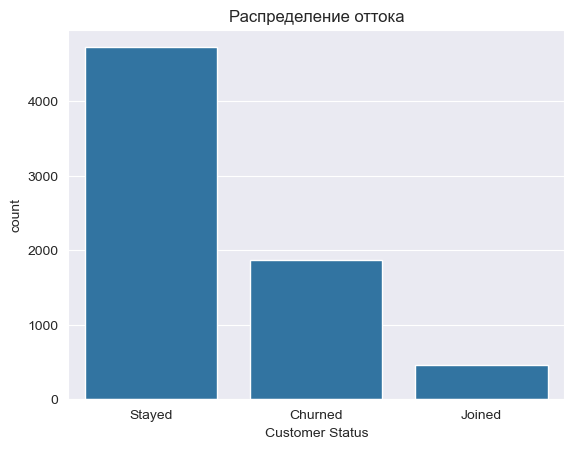

In [109]:
%matplotlib inline
sns.countplot(x='Customer Status', data=df)
plt.title('Распределение оттока')
plt.show()

#### Визуализация числовых признаков

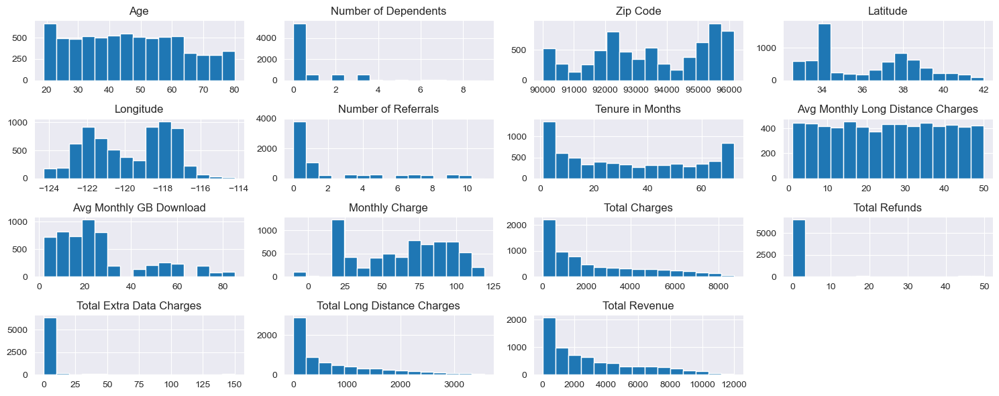

In [110]:
numeric_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
df[numeric_features].hist(bins=15, figsize=(15, 6), layout=(4, 4))
plt.tight_layout()
plt.show()

## Обучение и оценка моделей

### Предобработка данных

In [111]:
df.columns=df.columns.str.replace(" ","").str.lower()

### Работа с пустыми значениями

In [69]:
df.avgmonthlylongdistancecharges=df.avgmonthlylongdistancecharges.fillna(0.0)
df.multiplelines=df.multiplelines.fillna('no phone service')
no_internet=['internettype','onlinesecurity','onlinebackup','deviceprotectionplan','premiumtechsupport','streamingtv',
             'streamingmovies','streamingmusic','unlimiteddata']
df[no_internet]=df[no_internet].fillna('no internet service')
df.avgmonthlygbdownload=df.avgmonthlygbdownload.fillna(0)
df=df.drop(columns=['customerid','churncategory','churnreason','totalrefunds','zipcode','longitude','latitude','city'])

df.shape


In [112]:
df.isnull().sum()

customerid                          0
gender                              0
age                                 0
married                             0
numberofdependents                  0
city                                0
zipcode                             0
latitude                            0
longitude                           0
numberofreferrals                   0
tenureinmonths                      0
offer                            3877
phoneservice                        0
avgmonthlylongdistancecharges     682
multiplelines                     682
internetservice                     0
internettype                     1526
avgmonthlygbdownload             1526
onlinesecurity                   1526
onlinebackup                     1526
deviceprotectionplan             1526
premiumtechsupport               1526
streamingtv                      1526
streamingmovies                  1526
streamingmusic                   1526
unlimiteddata                    1526
contract    

Чтобы избежать предвзятости в прогнозах, удалиv информацию о клиентах, которые недавно присоединились к компании.

In [113]:
df=df.loc[~df.customerstatus.str.contains('Join')]
df.reset_index(drop=True,inplace=True)

In [114]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

In [116]:
type_ = ["No", "yes"]
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Pie(labels=type_, values=df['customerstatus'].value_counts(), name="customerstatus"))

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Churn', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [117]:
df.customerstatus[df.customerstatus == 'Stayed'].groupby(by = df.gender).count()

gender
Female    2338
Male      2382
Name: customerstatus, dtype: int64

In [28]:
df.customerstatus[df.customerstatus == 'Churned'].groupby(by = df.gender).count()

gender
Female    939
Male      930
Name: customerstatus, dtype: int64

In [118]:
fig = px.histogram(df, x="customerstatus", color = "contract", barmode = "group", title = "<b>Customer contract distribution<b>")
fig.update_layout(width=700, height=500, bargap=0.2)
fig.show()

#### Кодирование категориальных переменных

In [119]:

# Создадим объект для преобразования колонок типа object в int
le = LabelEncoder()
# Кодировка меток будет использоваться для столбцов с 2 или менее уникальными значениеями

le_count = 0
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))


6 columns were label encoded.


In [120]:
df['gender'] = [1 if each == 'Female' else 0 for each in df['gender']]
df.head()


,customerid,gender,age,married,numberofdependents,city,zipcode,latitude,longitude,numberofreferrals,...,paymentmethod,monthlycharge,totalcharges,totalrefunds,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus,churncategory,churnreason
0,0002-ORFBO,0,37,1,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,1,NaN,NaN
1,0003-MKNFE,0,46,0,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,1,NaN,NaN
2,0004-TLHLJ,0,50,0,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,0,Competitor,Competitor had better devices
3,0011-IGKFF,0,78,1,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,0,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,0,75,1,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,0,Dissatisfaction,Network reliability


In [82]:
def encode_data(dataframe):
    if dataframe.dtype == "object":
        dataframe = LabelEncoder().fit_transform(dataframe)
    return dataframe

data = df.apply(lambda x: encode_data(x))
data.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,0,37,1,0,2,9,5,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,1,46,0,0,0,9,5,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,1,50,0,0,0,4,4,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,1,78,1,0,1,13,3,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,0,75,1,0,3,3,5,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


In [121]:
# на всякий сохраним данные в csv файл
data.to_csv('mycsvfile.csv', index=False)

Далее, разделим наш датасет на обучающую и тестовую выборки.

In [122]:
X = data.drop(columns = "customerstatus")
y = data["customerstatus"].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4, stratify =y)

col=['totalcharges','avgmonthlylongdistancecharges','monthlycharge','totalrevenue','totallongdistancecharges',
     'tenureinmonths','totallongdistancecharges','totalextradatacharges']
scaler = StandardScaler()
X_train[col] = StandardScaler().fit_transform(X_train[col])
X_test[col] = StandardScaler().fit_transform(X_test[col])

### Обучение нескольких моделей



Это задача бинарной классификации, построим несколько моделей классификации.
Для начала просто возьмем базовые модели и оценим их, чтобы проверить, как они работают.


Мы обучим следующие модели:

- Логистическая регрессия
- Дерево решений
- Случайный лес
- Метод опорных векторов (SVM)
- XGBoost

#### Логистическая регрессия

In [123]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)
y_pred_lr = log_reg.predict(X_test)

####  Дерево решений

In [124]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)

#### Случайный лес

In [125]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

#### Метод опорных векторов

In [126]:
from sklearn.svm import SVC

svc = SVC(probability=True)
svc.fit(X_train, y_train)
y_pred_svc = svc.predict(X_test)

#### XGBoost

In [127]:
from xgboost import XGBClassifier

xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

### Оценка моделей

Мы оценим модели с помощью:

- Точности (Accuracy)
- Точности (Precision)
- Полноты (Recall)
- F1-мера
- ROC AUC
- Матрицы ошибок

####  Определение функции оценки

In [128]:
def evaluate_model(y_test, y_pred, model_name):
    print(f"Модель: {model_name}")
    print("Точность (Accuracy):", accuracy_score(y_test, y_pred))
    print("Отчет классификации:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Матрица ошибок для {model_name}')
    plt.show()

####  Оценка логистической регрессии

Модель: Логистическая регрессия
Точность (Accuracy): 0.8543247344461306
Отчет классификации:
              precision    recall  f1-score   support

           0       0.75      0.74      0.74       561
           1       0.90      0.90      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.85      0.85      0.85      1977



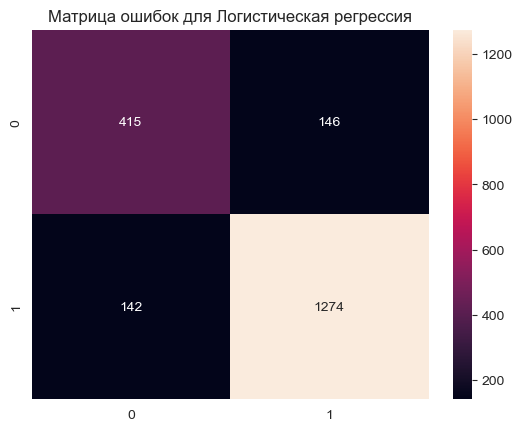

In [129]:
evaluate_model(y_test, y_pred_lr, 'Логистическая регрессия')

####  Оценка дерева решений

Модель: Дерево решений
Точность (Accuracy): 0.8391502276176024
Отчет классификации:
              precision    recall  f1-score   support

           0       0.72      0.71      0.72       561
           1       0.89      0.89      0.89      1416

    accuracy                           0.84      1977
   macro avg       0.80      0.80      0.80      1977
weighted avg       0.84      0.84      0.84      1977



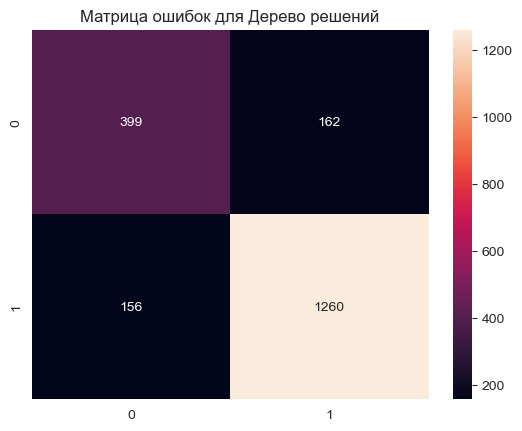

In [130]:
evaluate_model(y_test, y_pred_dt, 'Дерево решений')

####  Оценка случайного леса

Модель: Случайный лес
Точность (Accuracy): 0.8689934243803743
Отчет классификации:
              precision    recall  f1-score   support

           0       0.83      0.68      0.75       561
           1       0.88      0.94      0.91      1416

    accuracy                           0.87      1977
   macro avg       0.85      0.81      0.83      1977
weighted avg       0.87      0.87      0.86      1977



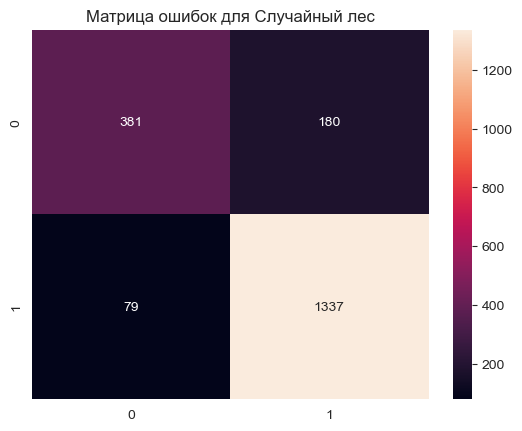

In [131]:
evaluate_model(y_test, y_pred_rf, 'Случайный лес')

####  Оценка SVM

Модель: Метод опорных векторов
Точность (Accuracy): 0.8047546788062722
Отчет классификации:
              precision    recall  f1-score   support

           0       0.72      0.51      0.60       561
           1       0.83      0.92      0.87      1416

    accuracy                           0.80      1977
   macro avg       0.77      0.71      0.73      1977
weighted avg       0.80      0.80      0.79      1977



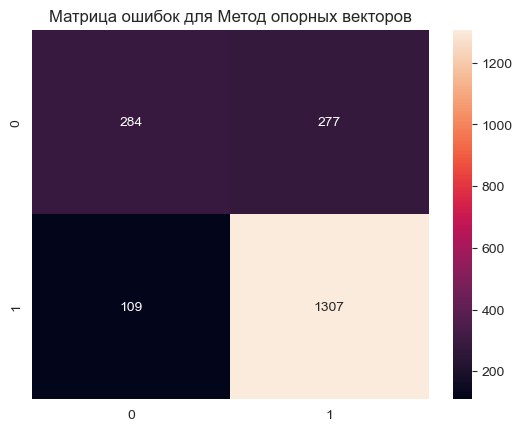

In [132]:
evaluate_model(y_test, y_pred_svc, 'Метод опорных векторов')

####  Оценка XGBoost

Модель: XGBoost
Точность (Accuracy): 0.8659585230146687
Отчет классификации:
              precision    recall  f1-score   support

           0       0.79      0.71      0.75       561
           1       0.89      0.93      0.91      1416

    accuracy                           0.87      1977
   macro avg       0.84      0.82      0.83      1977
weighted avg       0.86      0.87      0.86      1977



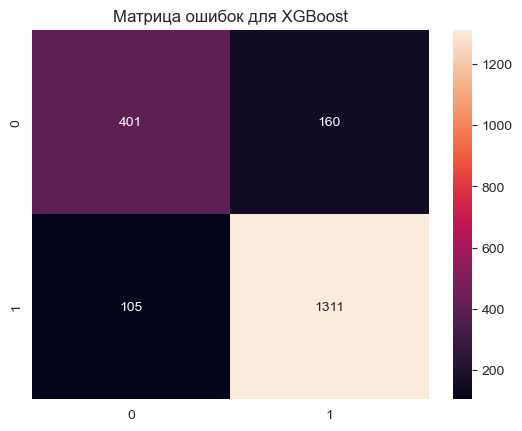

In [133]:
evaluate_model(y_test, y_pred_xgb, 'XGBoost')

###  Сравнение производительности моделей

In [134]:
models = ['Логистическая регрессия', 'Дерево решений', 'Случайный лес', 'SVM', 'XGBoost']
accuracy = [
    accuracy_score(y_test, y_pred_lr),
    accuracy_score(y_test, y_pred_dt),
    accuracy_score(y_test, y_pred_rf),
    accuracy_score(y_test, y_pred_svc),
    accuracy_score(y_test, y_pred_xgb)
]

roc_auc = [
    roc_auc_score(y_test, log_reg.predict_proba(X_test)[:, 1]),
    roc_auc_score(y_test, dt.predict_proba(X_test)[:, 1]),
    roc_auc_score(y_test, rf.predict_proba(X_test)[:, 1]),
    roc_auc_score(y_test, svc.predict_proba(X_test)[:, 1]),
    roc_auc_score(y_test, xgb.predict_proba(X_test)[:, 1])
]

performance_df = pd.DataFrame({'Модель': models, 'Точность': accuracy, 'ROC AUC': roc_auc})
performance_df.sort_values(by='ROC AUC', ascending=False)

,Модель,Точность,ROC AUC
4,XGBoost,0.865959,0.929949
2,Случайный лес,0.868993,0.925114
0,Логистическая регрессия,0.854325,0.913940
3,SVM,0.804755,0.863880
1,Дерево решений,0.839150,0.800530


### Подбор гиперпараметров

####  Подбор гиперпараметров для случайного леса

Лучшие параметры:  {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 5, 'n_estimators': 200}
Модель: Случайный лес с подбором гиперпараметров
Точность (Accuracy): 0.8735457764289327
Отчет классификации:
              precision    recall  f1-score   support

           0       0.84      0.68      0.75       561
           1       0.88      0.95      0.91      1416

    accuracy                           0.87      1977
   macro avg       0.86      0.82      0.83      1977
weighted avg       0.87      0.87      0.87      1977



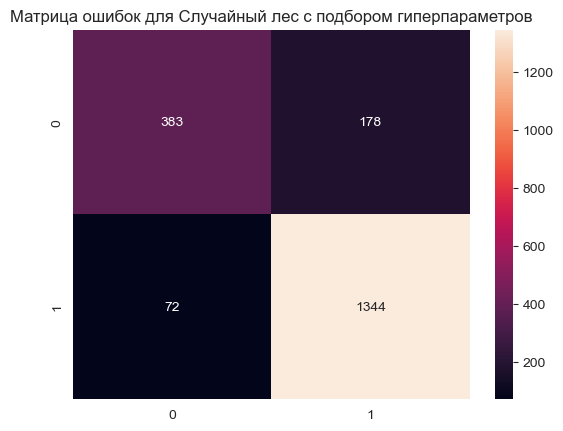

In [135]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5, 10]
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Лучшие параметры: ", grid_search.best_params_)

best_rf = grid_search.best_estimator_
y_pred_best_rf = best_rf.predict(X_test)
evaluate_model(y_test, y_pred_best_rf, 'Случайный лес с подбором гиперпараметров')

##  Улучшение моделей


Модель: Случайный лес с порогом 0.3
Точность (Accuracy): 0.8361153262518968
Отчет классификации:
              precision    recall  f1-score   support

           0       0.96      0.44      0.60       561
           1       0.82      0.99      0.90      1416

    accuracy                           0.84      1977
   macro avg       0.89      0.72      0.75      1977
weighted avg       0.86      0.84      0.81      1977



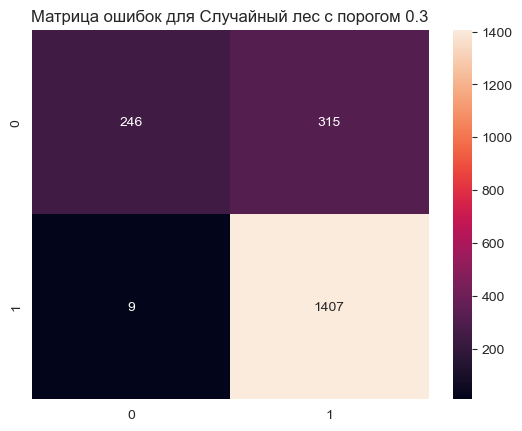

In [136]:
y_pred_proba = best_rf.predict_proba(X_test)[:,1]
threshold = 0.3  # Пример порога
y_pred_threshold = (y_pred_proba >= threshold).astype(int)
evaluate_model(y_test, y_pred_threshold, f'Случайный лес с порогом {threshold}')

In [137]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(best_rf, X_train, y_train, cv=5, scoring='roc_auc')
print("ROC AUC с кросс-валидацией:", scores)
print("Средний ROC AUC:", scores.mean())

ROC AUC с кросс-валидацией: [0.92782737 0.91832292 0.91520453 0.94174622 0.92474555]
Средний ROC AUC: 0.9255693175708537
